In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import warnings

warnings.filterwarnings("ignore")
pd.options.display.max_seq_items = 2000

# Sources:
# https://www.bikeshare.com/data/
# https://www.bluebikes.com/system-data
# https://crashviewer.nhtsa.dot.gov/CrashAPI
# https://hifld-geoplatform.opendata.arcgis.com/datasets/hospitals/data?selectedAttribute=BEDS Hospital Data
# https://en.wikipedia.org/wiki/List_of_United_States_cities_by_population Cities

In [2]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

In [4]:
# So the dataset is retrieved from: https://crashviewer.nhtsa.dot.gov/CrashAPI
#GET FARS data from accident, pbtype, and vehicle tables 
fars_acc2018 = pd.read_csv('data/FARS/FARS2018/ACCIDENT.csv')
fars_acc2017 = pd.read_csv('data/FARS/FARS2017/ACCIDENT.csv')
fars_acc2016 = pd.read_csv('data/FARS/FARS2016/ACCIDENT.csv')

fars_PB2018 = pd.read_csv('data/FARS/FARS2018/PBTYPE.csv')
fars_PB2017 = pd.read_csv('data/FARS/FARS2017/PBTYPE.csv')
fars_PB2016 = pd.read_csv('data/FARS/FARS2016/PBTYPE.csv')

fars_veh2018 = pd.read_csv('data/FARS/FARS2018/VEHICLE.csv',encoding= 'unicode_escape')
fars_veh2017 = pd.read_csv('data/FARS/FARS2017/VEHICLE.csv',encoding= 'unicode_escape')
fars_veh2016 = pd.read_csv('data/FARS/FARS2016/VEHICLE.csv',encoding= 'unicode_escape')

#Load Top10 Cities data
cities_df = pd.read_csv('data/Cities.csv')

In [5]:
#Join FARS accident and vehicle tables on state and st_case
fars_acc_veh_2018 = pd.merge(fars_acc2018, fars_veh2018,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])
fars_acc_veh_2017 = pd.merge(fars_acc2017, fars_veh2017,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])
fars_acc_veh_2016 = pd.merge(fars_acc2016, fars_veh2016,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])

In [6]:
#Join FARS accident and vehicle tables on state and st_case
fars_all_2018 = pd.merge(fars_acc_veh_2018, fars_PB2018,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])
fars_all_2017 = pd.merge(fars_acc_veh_2017, fars_PB2017,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])
fars_all_2016 = pd.merge(fars_acc_veh_2016, fars_PB2016,  how='left', left_on=['STATE','ST_CASE'], right_on = ['STATE','ST_CASE'])

In [7]:
FARS_16_17_18 = fars_all_2018.append([fars_all_2017, fars_all_2016])

In [8]:
#GET CRSS data from accident, pbtype, and vehicle tables 
crss_acc2018 = pd.read_csv('data/CRSS/CRSS2018/ACCIDENT.csv')
crss_acc2017 = pd.read_csv('data/CRSS/CRSS2017/ACCIDENT.csv')
crss_acc2016 = pd.read_csv('data/CRSS/CRSS2016/ACCIDENT.csv')

crss_PB2018 = pd.read_csv('data/CRSS/CRSS2018/PBTYPE.csv')
crss_PB2017 = pd.read_csv('data/CRSS/CRSS2017/PBTYPE.csv')
crss_PB2016 = pd.read_csv('data/CRSS/CRSS2016/PBTYPE.csv')

crss_veh2018 = pd.read_csv('data/CRSS/CRSS2018/VEHICLE.csv',encoding= 'unicode_escape')
crss_veh2017 = pd.read_csv('data/CRSS/CRSS2017/VEHICLE.csv',encoding= 'unicode_escape')
crss_veh2016 = pd.read_csv('data/CRSS/CRSS2016/VEHICLE.csv',encoding= 'unicode_escape')

In [9]:
#Join CRSS accident and vehicle tables on state and st_case
crss_acc_veh_2018 = pd.merge(crss_acc2018, crss_veh2018,  how='left', left_on=['CASENUM'], right_on = ['CASENUM'])
crss_acc_veh_2017 = pd.merge(crss_acc2017, crss_veh2017,  how='left', left_on=['CASENUM'], right_on = ['CASENUM'])
crss_acc_veh_2016 = pd.merge(crss_acc2016, crss_veh2016,  how='left', left_on=['CASENUM'], right_on = ['CASENUM'])

In [10]:
crss_all_2018 = pd.merge(crss_acc_veh_2018, crss_PB2018,  how='left', left_on=['CASENUM','VEH_NO'], right_on = ['CASENUM','VEH_NO'])
crss_all_2017 = pd.merge(crss_acc_veh_2017, crss_PB2017,  how='left', left_on=['CASENUM','VEH_NO'], right_on = ['CASENUM','VEH_NO'])
crss_all_2016 = pd.merge(crss_acc_veh_2016, crss_PB2016,  how='left', left_on=['CASENUM','VEH_NO'], right_on = ['CASENUM','VEH_NO'])

In [11]:
CRSS_16_17_18 = crss_all_2018.append([crss_all_2017, crss_all_2016])

In [12]:
##PLOT a count of accidents by year and month
yr_month_count=FARS_16_17_18.groupby(['YEAR','MONTH_x']).ST_CASE.nunique().reset_index().rename(columns={'ST_CASE':'count'})
Months_name = {1:"Jan", 2:"Feb", 3:"Mar", 4:"Apr", 5:"May", 6:"Jun", 
          7:"Jul", 8:"Aug", 9:"Sep", 10:"Oct", 11:"Nov", 12:"Dec"}
yr_month_count=yr_month_count.replace({"MONTH_x": Months_name})


months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
yr_month_count['month'] = pd.Categorical(yr_month_count['MONTH_x'], categories=months, ordered=True)

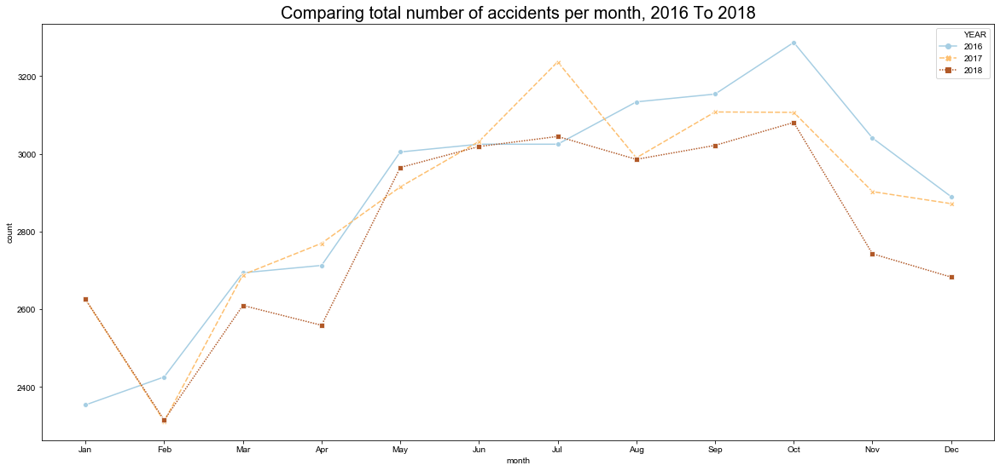

In [13]:
#Comparison of number of fatal accidents from 2016 to 2018
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
yr_month_count['month'] = pd.Categorical(yr_month_count['MONTH_x'], categories=months, ordered=True)
plt.figure(figsize=(20,9))
ax =sns.lineplot(data = yr_month_count, x='month',y='count', hue='YEAR',style="YEAR",ci=None,palette="Paired",markers=True)
ax.set_title('Comparing total number of accidents per month, 2016 To 2018',fontsize=20)
sns.set(font_scale=2)
sns.set_style("white")

plt.show()

In [14]:
pb=FARS_16_17_18[FARS_16_17_18['PBPTYPE'].notna()]

In [15]:
yr_month_count_pb=pb.groupby(['YEAR','MONTH_x']).ST_CASE.nunique().reset_index().rename(columns={'ST_CASE':'count'})

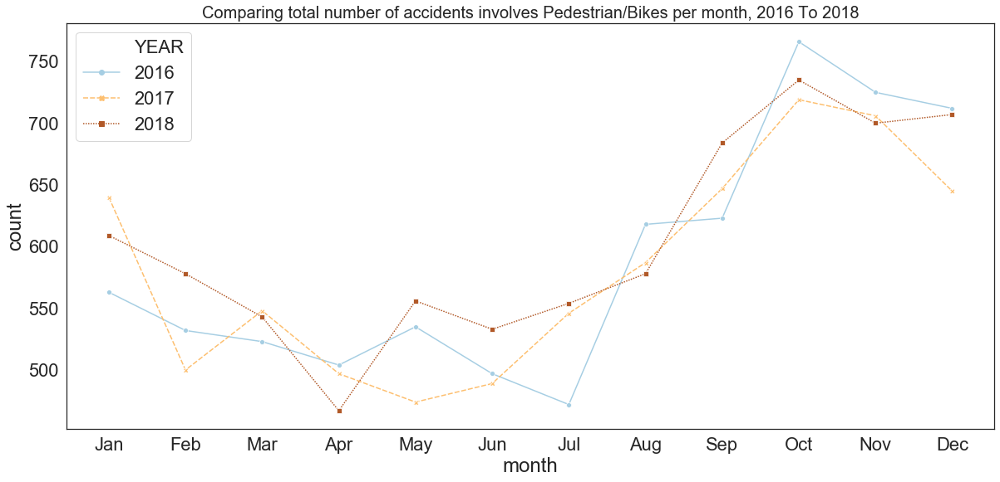

In [16]:
Months_name = {1:"Jan", 2:"Feb", 3:"Mar", 4:"Apr", 5:"May", 6:"Jun", 
          7:"Jul", 8:"Aug", 9:"Sep", 10:"Oct", 11:"Nov", 12:"Dec"}
yr_month_count_pb=yr_month_count_pb.replace({"MONTH_x": Months_name})

months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
yr_month_count_pb['month'] = pd.Categorical(yr_month_count_pb['MONTH_x'], categories=months, ordered=True)
plt.figure(figsize=(20,9))
ax =sns.lineplot(data = yr_month_count_pb, x='month',y='count', hue='YEAR',style="YEAR",ci=None,palette="Paired",markers=True)
ax.set_title('Comparing total number of accidents involves Pedestrian/Bikes per month, 2016 To 2018',fontsize=20)
sns.set(font_scale=2)
sns.set_style("white")

plt.show()

In [17]:
FARS_16_17_18.columns

Index(['ACC_TYPE', 'ARR_HOUR', 'ARR_MIN', 'BIKECGP', 'BIKECTYPE', 'BIKEDIR',
       'BIKELOC', 'BIKEPOS', 'BODY_TYP', 'BUS_USE', 'CARGO_BT', 'CDL_STAT',
       'CF1', 'CF2', 'CF3', 'CITY', 'COUNTY', 'DAY_WEEK', 'DAY_x', 'DAY_y',
       'DEATHS', 'DEFORMED', 'DRUNK_DR', 'DR_DRINK', 'DR_HGT', 'DR_PRES',
       'DR_SF1', 'DR_SF2', 'DR_SF3', 'DR_SF4', 'DR_WGT', 'DR_ZIP', 'EMER_USE',
       'FATALS', 'FIRE_EXP', 'FIRST_MO', 'FIRST_YR', 'FUNC_SYS', 'GVWR',
       'HARM_EV_x', 'HARM_EV_y', 'HAZ_CNO', 'HAZ_ID', 'HAZ_INV', 'HAZ_PLAC',
       'HAZ_REL', 'HIT_RUN', 'HOSP_HR', 'HOSP_MN', 'HOUR_x', 'HOUR_y',
       'IMPACT1', 'J_KNIFE', 'LAST_MO', 'LAST_YR', 'LATITUDE', 'LGT_COND',
       'LONGITUD', 'L_COMPL', 'L_ENDORS', 'L_RESTRI', 'L_STATE', 'L_STATUS',
       'L_TYPE', 'MAKE', 'MAK_MOD', 'MAN_COLL_x', 'MAN_COLL_y', 'MCARR_I1',
       'MCARR_I2', 'MCARR_ID', 'MILEPT', 'MINUTE_x', 'MINUTE_y', 'MODEL',
       'MOD_YEAR', 'MONTH_x', 'MONTH_y', 'MOTDIR', 'MOTMAN', 'M_HARM', 'NHS',
       'NOT_HOUR'

In [18]:
FARS_16_17_18.dtypes

ACC_TYPE      int64  
ARR_HOUR      int64  
ARR_MIN       int64  
BIKECGP       float64
BIKECTYPE     float64
BIKEDIR       float64
BIKELOC       float64
BIKEPOS       float64
BODY_TYP      int64  
BUS_USE       int64  
CARGO_BT      int64  
CDL_STAT      int64  
CF1           int64  
CF2           int64  
CF3           int64  
CITY          int64  
COUNTY        int64  
DAY_WEEK      int64  
DAY_x         int64  
DAY_y         int64  
DEATHS        int64  
DEFORMED      int64  
DRUNK_DR      int64  
DR_DRINK      int64  
DR_HGT        int64  
DR_PRES       int64  
DR_SF1        int64  
DR_SF2        int64  
DR_SF3        int64  
DR_SF4        int64  
DR_WGT        int64  
DR_ZIP        int64  
EMER_USE      int64  
FATALS        int64  
FIRE_EXP      int64  
FIRST_MO      int64  
FIRST_YR      int64  
FUNC_SYS      int64  
GVWR          int64  
HARM_EV_x     int64  
HARM_EV_y     int64  
HAZ_CNO       int64  
HAZ_ID        int64  
HAZ_INV       int64  
HAZ_PLAC      int64  
HAZ_REL   

In [19]:
#Filtering records containing Not, Arr and Hosp Time
FARS_hosp_time = FARS_16_17_18[(FARS_16_17_18['NOT_HOUR']!=99) & (FARS_16_17_18['NOT_HOUR']!=88) & 
                                      (FARS_16_17_18['ARR_HOUR']!=99) & (FARS_16_17_18['ARR_HOUR']!=88) & 
                                      (FARS_16_17_18['HOSP_HR']!=99) & (FARS_16_17_18['HOSP_HR']!=88)&
                              (FARS_16_17_18['NOT_MIN']!=99)&(FARS_16_17_18['NOT_MIN']!=88)&
                              (FARS_16_17_18['ARR_MIN']!=99)&(FARS_16_17_18['ARR_MIN']!=88)&
                              (FARS_16_17_18['HOSP_MN']!=99)&(FARS_16_17_18['HOSP_MN']!=88)]
FARS_hosp_time1 = FARS_hosp_time[['NOT_HOUR', 'NOT_MIN', 'ARR_HOUR', 'ARR_MIN', 'HOSP_HR', 'HOSP_MN']]
FARS_hosp_time1['NOT_MIN'].unique()

array([52, 49, 24, 13,  8, 53, 29, 34,  0, 32, 59, 31,  1, 35, 45, 26, 36,
       37, 55, 12, 22, 10,  7, 30,  2, 20, 47,  5,  4, 57, 28, 51, 44, 58,
       40, 19, 27, 11, 48,  3, 16, 43, 50, 38, 46,  9, 56, 17, 41,  6, 18,
       25, 14, 15, 21, 23, 39, 54, 42, 33])

In [20]:
FARS_hosp_time['Notification_Time'] = (pd.to_datetime(FARS_hosp_time['YEAR'].astype(str) + ':'+
                                                      FARS_hosp_time['MONTH_x'].astype(str) + ':'+
                                                      FARS_hosp_time['DAY_x'].astype(str) + ':'+
                                                      FARS_hosp_time['NOT_HOUR'].astype(str) + ':' +
                                                            FARS_hosp_time['NOT_MIN'].astype(str), 
                                                            format='%Y:%m:%d:%H:%M'))


In [21]:
FARS_hosp_time['Arrival_Time'] = (pd.to_datetime(FARS_hosp_time['YEAR'].astype(str) + ':'+
                                                 FARS_hosp_time['MONTH_x'].astype(str) + ':'+
                                                 FARS_hosp_time['DAY_x'].astype(str) + ':'+
                                                 FARS_hosp_time['ARR_HOUR'].astype(str) + ':' +
                                                 FARS_hosp_time['ARR_MIN'].astype(str), 
                                                             format='%Y:%m:%d:%H:%M'))

In [22]:
FARS_hosp_time['Hospital_Time'] = (pd.to_datetime(FARS_hosp_time['YEAR'].astype(str) + ':'+
                                                      FARS_hosp_time['MONTH_x'].astype(str) + ':'+
                                                      FARS_hosp_time['DAY_x'].astype(str) + ':'+
                                                      FARS_hosp_time['HOSP_HR'].astype(str) + ':' +
                                                           FARS_hosp_time['HOSP_MN'].astype(str), 
                                                            format='%Y:%m:%d:%H:%M'))




In [23]:
# I WAS NEVER ABLE TO RUN THIS CELL
# FARS_hosp_time['Time_to_Accident'] = (FARS_hosp_time['Arrival_Time'] - 
#                                         FARS_hosp_time['Notification_Time'])

# FARS_hosp_time['Time_to_Hospital'] = (FARS_hosp_time['Hospital_Time'] - 
#                                         FARS_hosp_time['Arrival_Time'])

# FARS_hosp_time['Total_Time'] = (FARS_hosp_time['Hospital_Time'] - 
#                                         FARS_hosp_time['Notification_Time'])
# FARS_hosp_time

In [24]:
#Extract Lat and Long independently to plot cities and convert to float
cities_df['Lat'] = cities_df['Location'].str.extract('(\d+\.\d+)').astype(float)
cities_df['Lon'] = (cities_df['Location'].str.extract('\s(\d+\.\d+)').astype(float))*-1

#Convert Lat and Long to radians to faciliate creating a radius for the city
cities_df['Lat_rad'] = cities_df['Lat'] * np.pi / 180
cities_df['Lon_rad'] = cities_df['Lon'] * np.pi / 180
# Get land area in km2
cities_df['Land'] = cities_df['2016 land area [km2]'].str.extract('([\d,]+\.\d+)').replace(',','')
cities_df['Land'] = cities_df['Land'].str.replace(',','').astype(float)



In [25]:
#Convert Lat and Lon to radians in the FARS data to extract fatalities in a radius for top ten cities
FARS_16_17_18['Lat_rad'] = FARS_16_17_18['LATITUDE'] * np.pi / 180
FARS_16_17_18['Lon_rad'] = FARS_16_17_18['LONGITUD'] * np.pi / 180

def radius(Lat1, Lon1, Lat2, Lon2):
    # http://www.movable-type.co.uk/scripts/latlong.html?from=48.6093070,-122.4259880&to=48.5928360,-122.4216130
    # http://janmatuschek.de/LatitudeLongitudeBoundingCoordinates
    # Lat/Lon1 is for the top city and Lat/Lon2 is for the accident in FARS data set
    return np.arccos((np.sin(Lat1) * np.sin(Lat2)) + 
                     (np.cos(Lat1) * np.cos(Lat2) * np.cos(Lon2 - (Lon1)))) * 6371

rad = np.sqrt(cities_df['Land'][0])

ny_df = FARS_16_17_18[radius(cities_df['Lat_rad'][0],cities_df['Lon_rad'][0],FARS_16_17_18['Lat_rad'], FARS_16_17_18['Lon_rad']) <= rad].reset_index()

FARS_Top_Cities = pd.DataFrame() 

for i in range(len(cities_df)):
    rad = np.sqrt(cities_df['Land'][i])
    FARS_Top_Cities = FARS_Top_Cities.append(FARS_16_17_18[radius(cities_df['Lat_rad'][i],
                                                                  cities_df['Lon_rad'][i],
                                                                  FARS_16_17_18['Lat_rad'], 
                                                                  FARS_16_17_18['Lon_rad']) <= rad])
    
    
    
FARS_Top_Cities.reset_index(inplace=True)

In [26]:
# Create Folium Map of Top ten cities and add different attributes to the map such as Bike Stations, Accidents, Hospitals...
m = folium.Map(location=[40, -96], zoom_start=4.4)

for i in range(len(cities_df)): #Top Ten Cities
    folium.Circle(location=[cities_df['Lat'][i], cities_df['Lon'][i]],
      popup='name',
      radius=15,
      color='blue',
      fill=True,
      fill_color='blue'
   ).add_to(m)
    
for i in range(len(FARS_Top_Cities)): #Crash
    folium.Circle(location=[FARS_Top_Cities['LATITUDE'][i], FARS_Top_Cities['LONGITUD'][i]],
      popup='name',
      radius=80,
      color='red',
      fill=True,
      fill_color='red'
   ).add_to(m)    
    
# for i in range(len(crash_boston_cyclist_df)): #Crash invovled cyclist
#     folium.Circle(location=[crash_boston_cyclist_df['latitude'][i], crash_boston_cyclist_df['longitud'][i]],
#       popup='name',
#       radius=500,
#       color='yellow',
#       fill=True,
#       fill_color='yellow'
#    ).add_to(m)   
    
# for i in range(len(hospitals_df)): #Hospital Location
#     folium.Circle(location=[hospitals_df['LATITUDE'][i], hospitals_df['LONGITUDE'][i]],
#       popup='name',
#       radius=50,
#       color='green',
#       fill=True,
#       fill_color='green'
#    ).add_to(m) 

m